In [43]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
import os
import sys
current_path = os.getcwd()
parent_directory = os.path.dirname(current_path)
sys.path.append(parent_directory)
from Class.jenie import Jenie
import pandas as pd
import numpy as np
import scanpy as sc
import anndata
import umap.umap_ as umap
import leidenalg
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
from sklearn.cluster import KMeans
from scipy.spatial.distance import pdist, squareform
from sklearn.metrics import pairwise_distances
from scipy.stats import zscore
from matplotlib.colorbar import ColorbarBase
import matplotlib.colors as mcolors
from umap import UMAP
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import silhouette_score
from kneed import KneeLocator
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import ParameterGrid

In [3]:
plt.style.use('dark_background')

In [4]:
cbm2_scdata = sc.read_h5ad(r"D:\SMI-0214_DonCleveland_UCSD\SMI-0214_DonCleveland_UCSD\Gellyfish Analysis\CBM2_new_immmature_dg.h5ad")
cbm2_scdata

AnnData object with n_obs × n_vars = 57489 × 223
    obs: 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'leiden', 'Experiment', 'Age', 'Mouse', 'Section', 'Treatment', 'celltype', 'MERFISH celltype', 'general_celltype'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'leiden', 'leiden_colors', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_spatial', 'X_umap'
    obsp: 'connectivities', 'distances'

In [5]:
cosmx_scdata = sc.read_h5ad(r"D:\SMI-0214_DonCleveland_UCSD\SMI-0214_DonCleveland_UCSD\Cosmx_mouse_filtered.h5ad")

In [6]:
right_side_scdata = cosmx_scdata[cosmx_scdata.obsm['X_spatial'][:, 0] >= -445000]
right_side_scdata

View of AnnData object with n_obs × n_vars = 63477 × 950
    obs: 'total_counts', 'leiden', 'celltype'
    var: 'mean', 'std'
    uns: 'celltype_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca'
    obsm: 'X_pca', 'X_raw', 'X_spatial', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [7]:
hd_175_2_scdata = right_side_scdata[right_side_scdata.obsm['X_spatial'][:, 1] > 15000]
hd_175_2_scdata

View of AnnData object with n_obs × n_vars = 31027 × 950
    obs: 'total_counts', 'leiden', 'celltype'
    var: 'mean', 'std'
    uns: 'celltype_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca'
    obsm: 'X_pca', 'X_raw', 'X_spatial', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

# Ingest based on 'MERFISH celltype'

In [25]:
adata_ref

AnnData object with n_obs × n_vars = 57489 × 73
    obs: 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'leiden', 'Experiment', 'Age', 'Mouse', 'Section', 'Treatment', 'celltype', 'MERFISH celltype', 'general_celltype'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'leiden', 'leiden_colors', 'neighbors', 'umap', 'pca', 'general_celltype_colors'
    obsm: 'X_pca', 'X_spatial', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [8]:
adata_ref = cbm2_scdata
adata = hd_175_2_scdata
#adata.X = adata.X.toarray()
shared = adata_ref.var_names.intersection(adata.var_names)
adata_ref = adata_ref[:,shared]
adata_merfish = adata[:, shared]
sc.pp.pca(adata_ref)
sc.pp.neighbors(adata_ref)
sc.tl.umap(adata_ref)
sc.tl.ingest(adata_merfish, adata_ref, obs="MERFISH celltype")

C:\Users\krist\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_pca.py:314: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm["X_pca"] = X_pca
C:\Users\krist\AppData\Local\Programs\Python\Python311\Lib\site-packages\umap\umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
<frozen _collections_abc>:949: ImplicitModificationWarning: Setting element `.obsm['rep']` of view, initializing view as actual.
<frozen _collections_abc>:949: ImplicitModificationWarning: Setting element `.obsm['X_umap']` of view, initializing view as actual.
<frozen _collections_abc>:949: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.


### Plot Cosmx Ingest Umap / Brain Proj

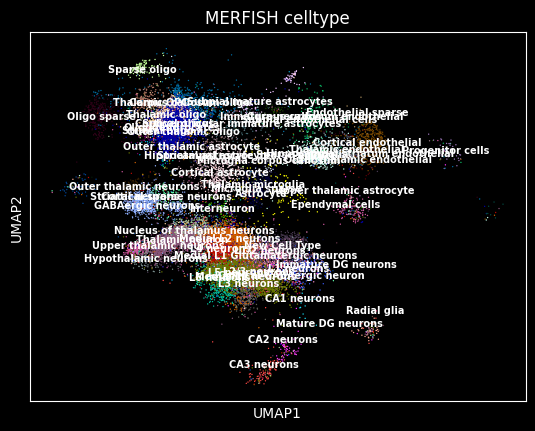

In [9]:
sc.pl.umap(adata_merfish, color = 'MERFISH celltype', legend_loc = 'on data', legend_fontsize = 7)

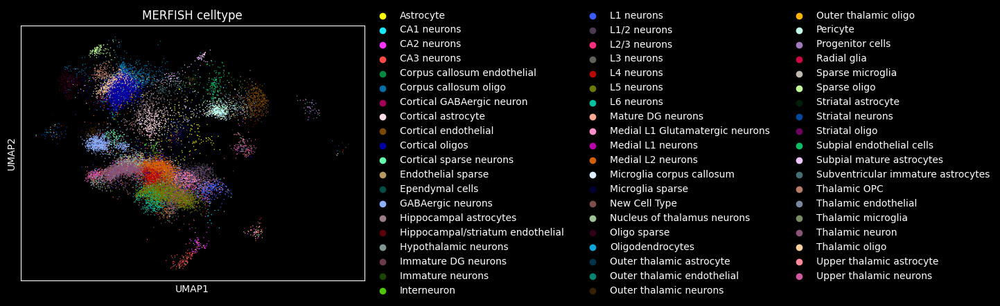

In [10]:
sc.pl.umap(adata_merfish, color = 'MERFISH celltype')

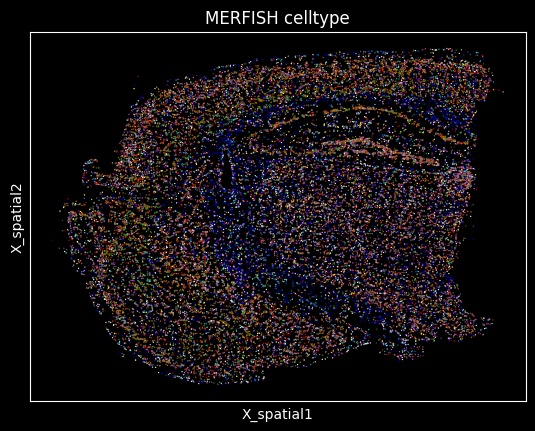

In [11]:
sc.pl.embedding(adata_merfish, basis = 'X_spatial', color = 'MERFISH celltype', legend_loc = 'on')

In [39]:
adata_cosmx_ingest = Jenie(adata_merfish, 'adata_cosmx_ingest', 'adata_cosmx_ingest', pallete='merfish_celltype', save = True)

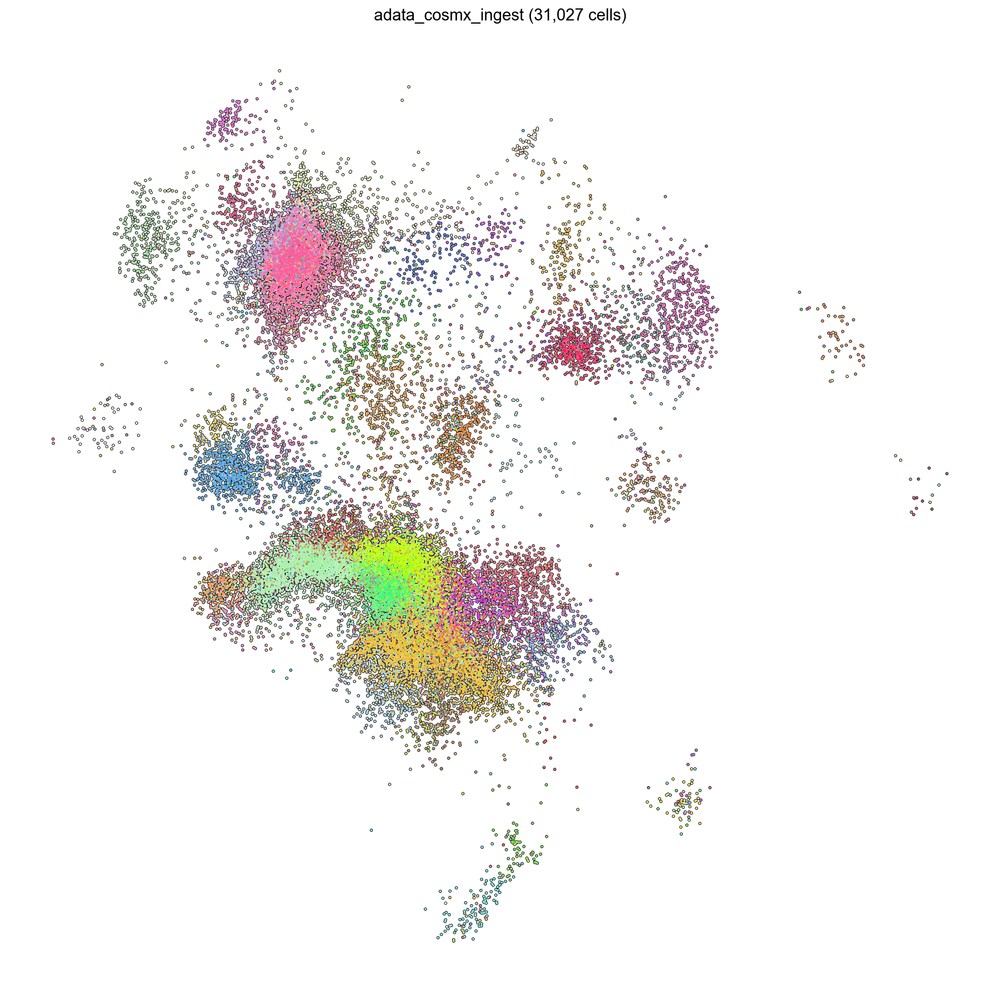

In [40]:
adata_cosmx_ingest.umap(group='MERFISH celltype', size = 10)

In [12]:
adata_merfish.obs['MERFISH celltype'].value_counts()

Cortical oligos                       5394
L5 neurons                            3743
Thalamic neuron                       3686
Medial L2 neurons                     3438
L4 neurons                            2589
L1/2 neurons                          1356
GABAergic neurons                      946
Thalamic oligo                         800
Corpus callosum oligo                  683
Medial L1 Glutamatergic neurons        653
Pericyte                               623
L6 neurons                             585
Upper thalamic neurons                 546
Nucleus of thalamus neurons            530
L3 neurons                             465
Cortical endothelial                   444
Microglia sparse                       413
Cortical astrocyte                     404
Oligo sparse                           339
L1 neurons                             304
Hippocampal astrocytes                 292
Thalamic OPC                           211
L2/3 neurons                           204
Subpial end

### Plot Cbm2 Umap / Brain Proj

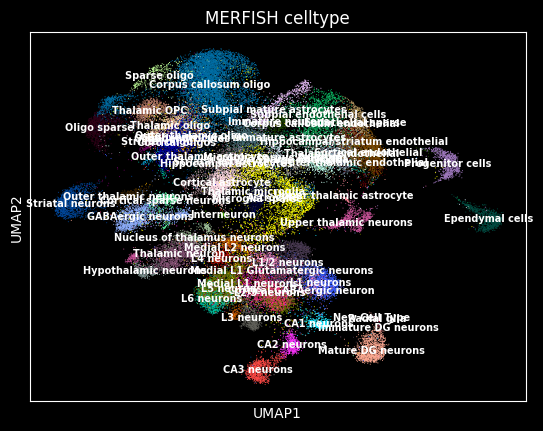

In [13]:
sc.pl.umap(adata_ref, color = 'MERFISH celltype', legend_loc = 'on data', legend_fontsize = 7)

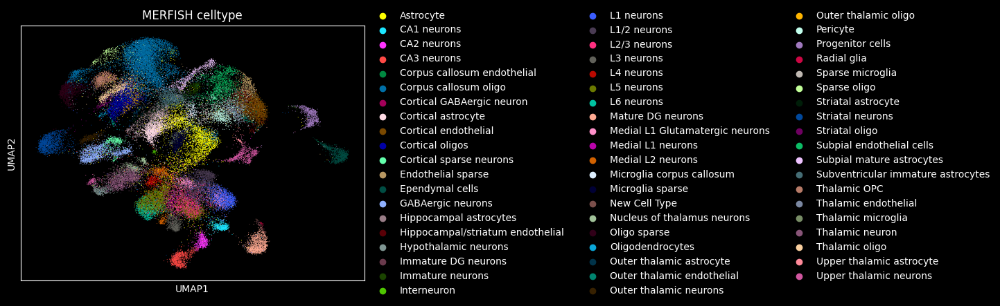

In [14]:
sc.pl.umap(adata_ref, color = 'MERFISH celltype')

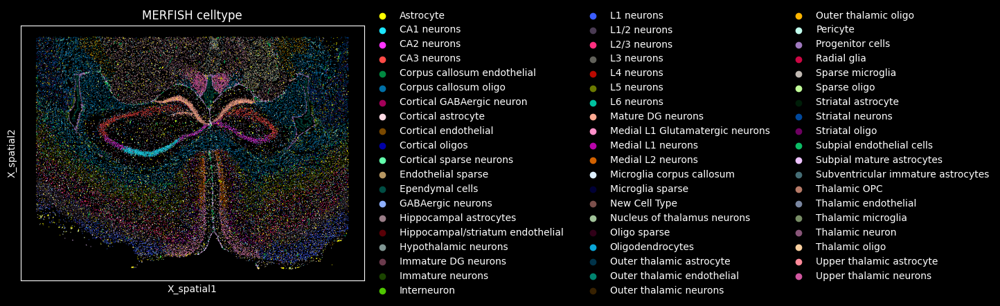

In [15]:
sc.pl.embedding(adata_ref, basis = 'X_spatial', color = 'MERFISH celltype')

In [33]:
adata_gellyfish_cosmx_ingest = Jenie(adata_ref, 'adata_gellyfish_cosmx_ingest', 'adata_gellyfish_cosmx_ingest', pallete='merfish_celltype', save = True)

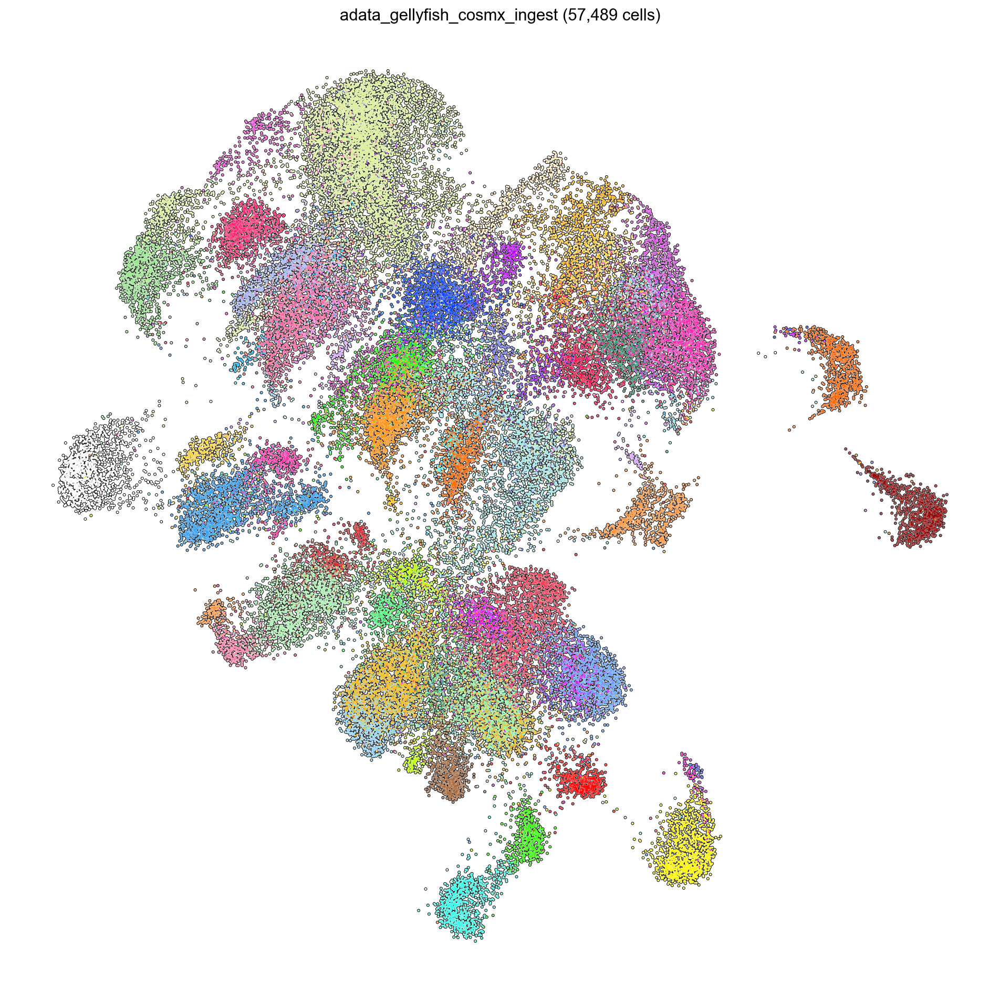

In [38]:
adata_gellyfish_cosmx_ingest.umap(group='MERFISH celltype', size=10)

In [16]:
adata_ref.obs['MERFISH celltype'].value_counts()

Corpus callosum oligo                 7430
Astrocyte                             3399
L5 neurons                            3107
L1/2 neurons                          1993
Cortical endothelial                  1919
Cortical astrocyte                    1796
Thalamic neuron                       1710
GABAergic neurons                     1710
Cortical oligos                       1670
Striatal neurons                      1616
L1 neurons                            1562
L2/3 neurons                          1464
Subventricular immature astrocytes    1358
Mature DG neurons                     1353
Oligo sparse                          1182
Hippocampal astrocytes                1145
Pericyte                              1087
Thalamic OPC                          1029
Subpial endothelial cells             1013
Medial L1 Glutamatergic neurons       1009
Ependymal cells                        970
Upper thalamic neurons                 968
CA3 neurons                            963
Thalamic ol

# Ingest based on 'general_celltype'

In [17]:
adata_ref = cbm2_scdata
adata = hd_175_2_scdata
#adata.X = adata.X.toarray()
shared = adata_ref.var_names.intersection(adata.var_names)
adata_ref = adata_ref[:,shared]
adata_general = adata[:, shared]
sc.pp.pca(adata_ref)
sc.pp.neighbors(adata_ref)
sc.tl.umap(adata_ref)
sc.tl.ingest(adata_general, adata_ref, obs="general_celltype")

C:\Users\krist\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_pca.py:314: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm["X_pca"] = X_pca
C:\Users\krist\AppData\Local\Programs\Python\Python311\Lib\site-packages\umap\umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
<frozen _collections_abc>:949: ImplicitModificationWarning: Setting element `.obsm['rep']` of view, initializing view as actual.
<frozen _collections_abc>:949: ImplicitModificationWarning: Setting element `.obsm['X_umap']` of view, initializing view as actual.
<frozen _collections_abc>:949: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.


### Plot Cosmx Ingest Umap / Brain Proj

In [46]:
list(adata_ref.obs['general_celltype'].unique())

['Oligo',
 'Microglia',
 'Endo',
 'Neurons',
 'Pericyte',
 'Astro',
 'Progenitor',
 'Ependymal',
 'Immature Neurons',
 'Glial',
 'New Cell Type']

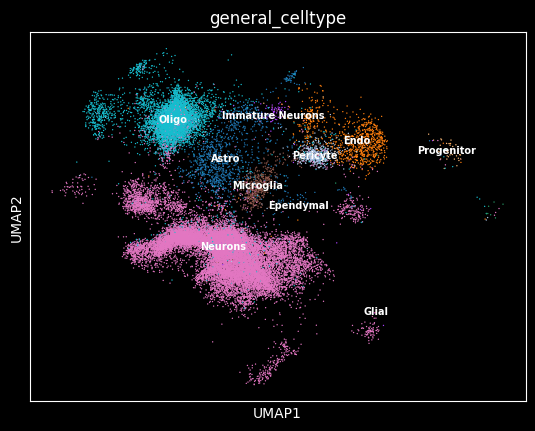

In [18]:
sc.pl.umap(adata_general, color = 'general_celltype', legend_loc = 'on data', legend_fontsize = 7)

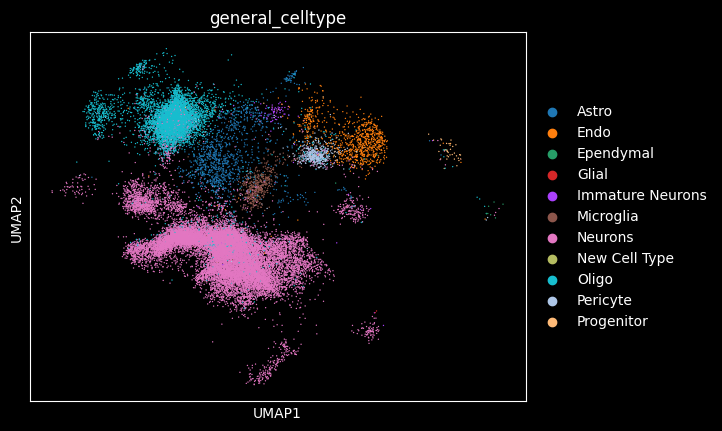

In [19]:
sc.pl.umap(adata_general, color = 'general_celltype')

In [61]:
cosmx_ingest_general = Jenie(adata_general, 'cosmx_ingest_general', 'cosmx_ingest_general', pallete= 'general_celltype', save = True)

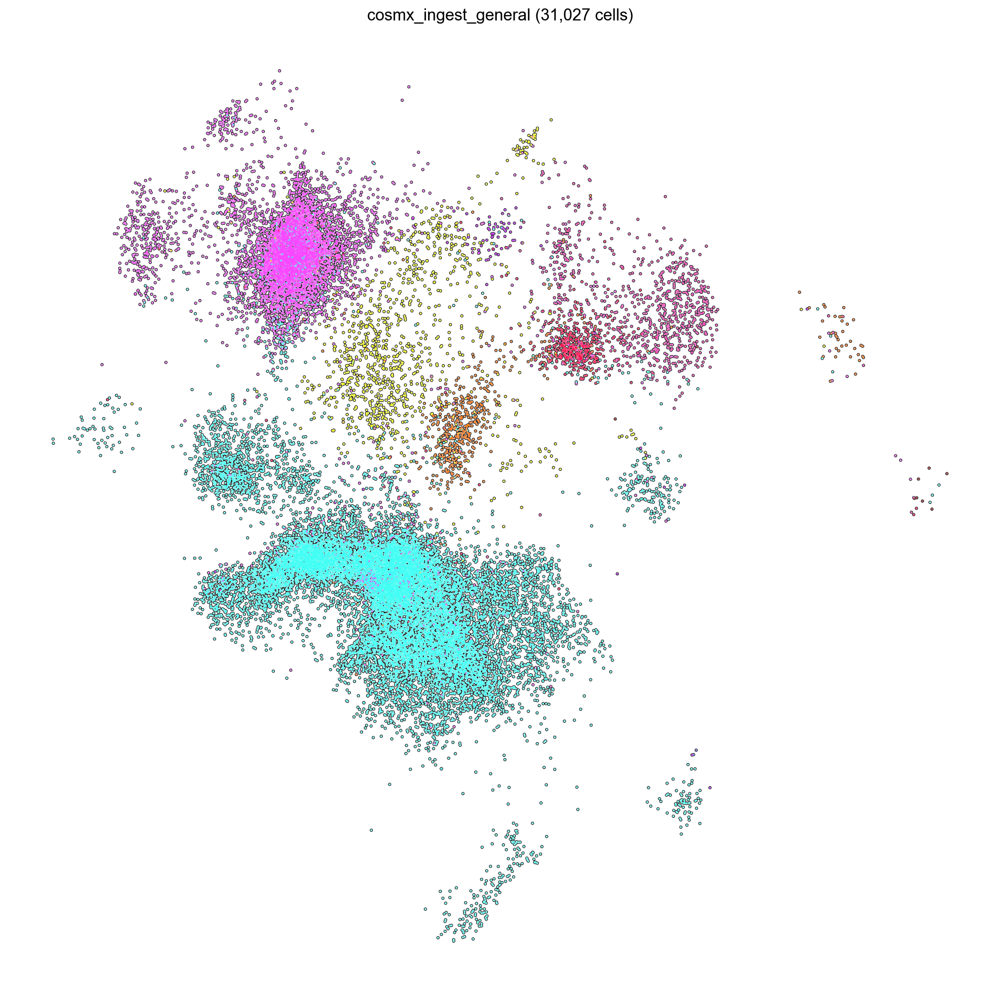

In [62]:
cosmx_ingest_general.umap(group = 'general_celltype', size = 10)

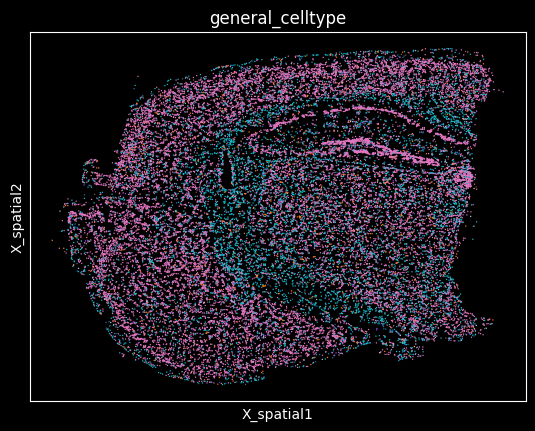

In [20]:
sc.pl.embedding(adata_general, basis = 'X_spatial', color = 'general_celltype', legend_loc = 'on')

In [21]:
adata_general.obs['general_celltype'].value_counts()

Neurons             20426
Oligo                7468
Astro                1110
Endo                  838
Pericyte              520
Microglia             509
Immature Neurons       91
Progenitor             45
Ependymal              18
Glial                   2
New Cell Type           0
Name: general_celltype, dtype: int64

### Plot Cbm2 Umap / Brain Proj

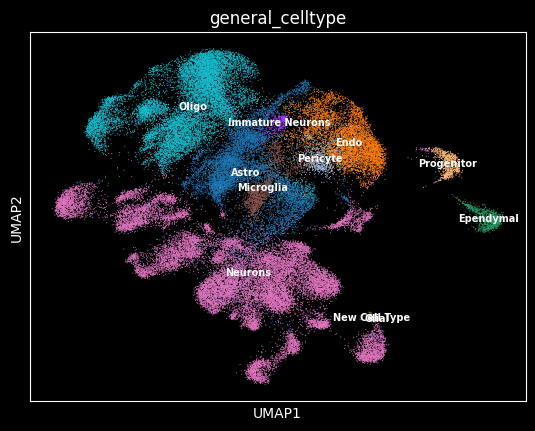

In [22]:
sc.pl.umap(adata_ref, color = 'general_celltype', legend_loc = 'on data', legend_fontsize = 7)

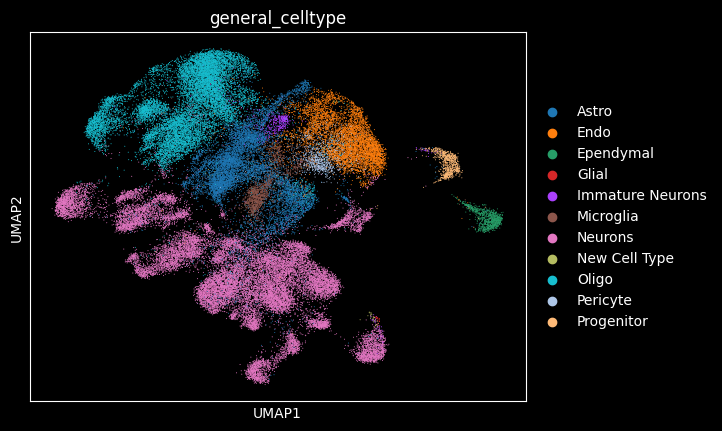

In [23]:
sc.pl.umap(adata_ref, color = 'general_celltype')

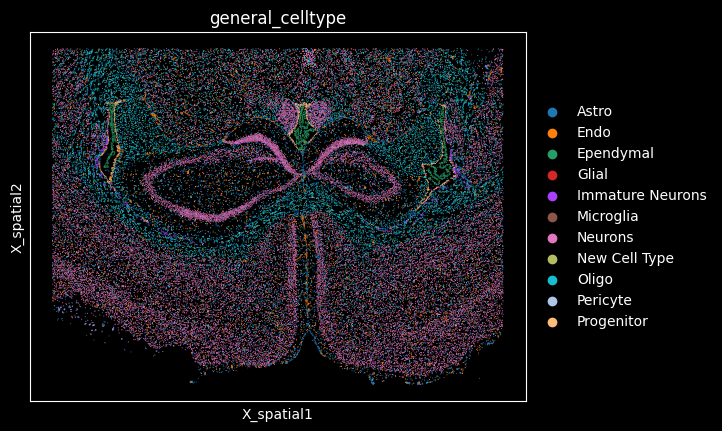

In [24]:
sc.pl.embedding(adata_ref, basis = 'X_spatial', color = 'general_celltype')

In [65]:
gellyfish_ingest_cosmx_general = Jenie(adata_ref, 'gellyfish_ingest_cosmx_general', 'gellyfish_ingest_cosmx_general', pallete='general_celltype', save = True)

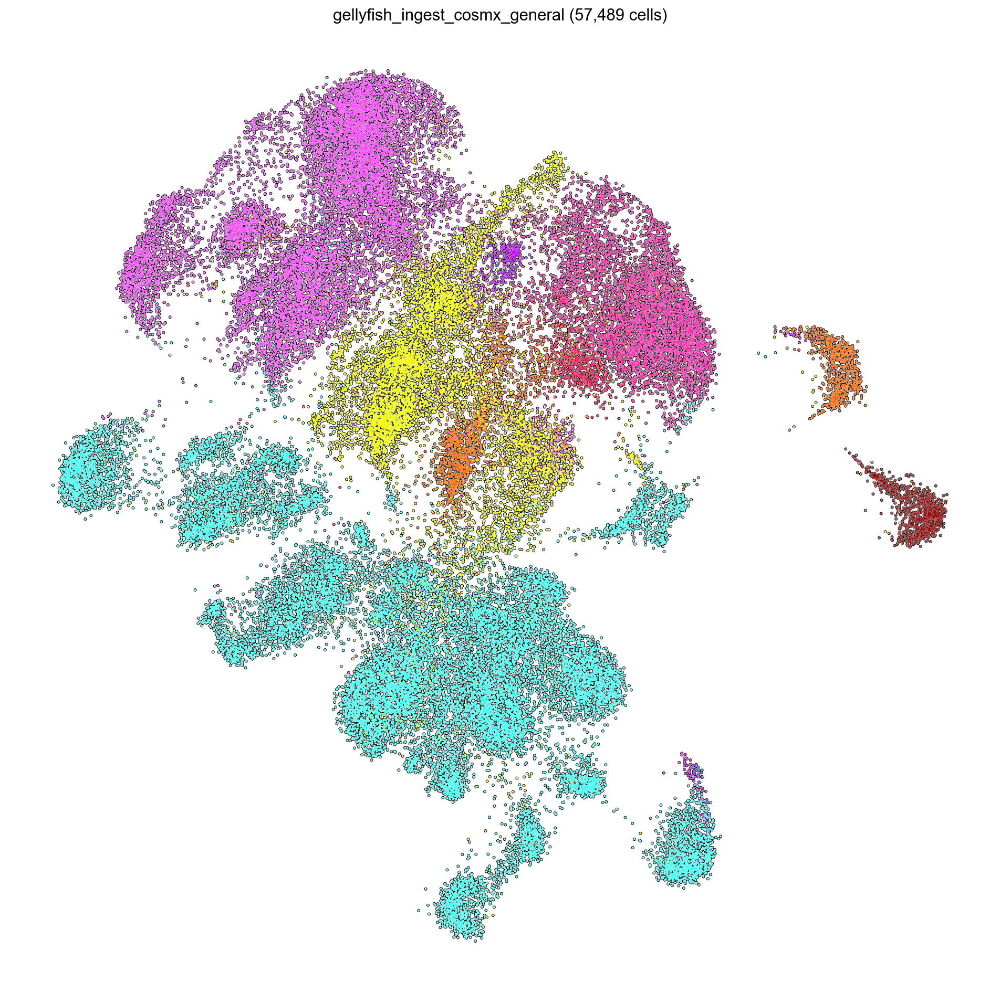

In [66]:
gellyfish_ingest_cosmx_general.umap(group = 'general_celltype', size = 10)